<center>

# Fundamentals of Data Science Assignment 1
## Group A3

### Topic: Examining the UN General Assembly Debates to Predict Peace

Date: 30 September, 2024

</center>
Group members:

- Abhinav Agnihotry  `15667766`
- Brent Brakenhoff   `13068989`
- Jonathan van der Maas   `15248844`
- Shantanu Motiani   `13757830`

## 1. Data Prepration

In [1]:
# !pip install pycountry

In [2]:
import os
import re
import nltk
from nltk.corpus import stopwords
import matplotlib.pyplot as plt
import seaborn as sns
import pycountry
import numpy as np
import pandas as pd

#### Read UN Speech Dataset

In [3]:
# Read the UN Speech dataset
sessions = np.arange(1, 79)
data=[]

for session in sessions:
    if session < 10:
        str_session = "0" + str(session)
    else:
        str_session = str(session)
    directory = "./data/TXT/Session "+str_session+" - "+str(1945+session)
    for filename in os.listdir(directory):
        with open(os.path.join(directory, filename), encoding='latin-1') as f:
            if filename[0]==".": #ignore hidden files
                continue
            splt = filename.split("_")
            speech = f.read()
            data.append([session, 1945+session, splt[0], speech])

df_speech = pd.DataFrame(data, columns=['Session','Year','ISO-alpha3 Code','Speech'])

df_speech.head()

,Session,Year,ISO-alpha3 Code,Speech
0,1,1946,LBR,I give you the greetings of the Government and...
1,1,1946,UKR,The day before yesterday the head of the deleg...
2,1,1946,IRN,During the first part of the first session of ...
3,1,1946,CAN,"If were not anxious, like all my colleagues, ..."
4,1,1946,HTI,A new world is being born from the fragments o...


#### Read Happiness file

In [4]:
happinessdataframe = pd.read_excel('./data/DataForTable2.1.xls', index_col=[0,1]) 

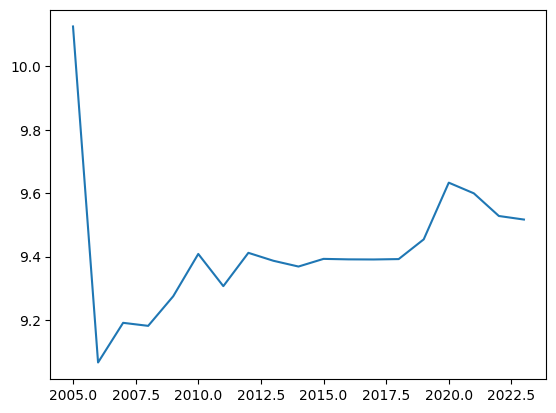

In [5]:
# using matplotlib explicitly
x = happinessdataframe.groupby('year').mean()['Log GDP per capita']
fig, ax = plt.subplots()
ax.plot(x)
plt.show()

In [6]:
# converts a country name to its ISO-alpha3 Code
def country_name_to_code(country_name):
    try:
        country = pycountry.countries.lookup(country_name)
        return country.alpha_3  # This gives the three-letter code
    except LookupError:
        return country_name[:3].upper()

In [7]:
happinessdataframe['Country code'] = happinessdataframe.index.get_level_values('Country name').map(country_name_to_code)
df_s0523 = df_speech[df_speech['Year'] >= 2008]

df1_reset = happinessdataframe.reset_index()
merged_df = pd.merge(df1_reset, df_s0523, how='inner', left_on=['Country code', 'year'], right_on=['ISO-alpha3 Code', 'Year'])

merged_df = merged_df.drop(columns=['ISO-alpha3 Code', 'Year', 'Session'])

df_1 = merged_df.set_index(['Country name', 'year'])
df_1

Life Ladder  Log GDP per capita  Social support  \
Country name year                                                    
Afghanistan  2008     3.723590            7.350416        0.450662   
             2009     4.401778            7.508646        0.552308   
             2010     4.758381            7.613900        0.539075   
             2011     3.831719            7.581259        0.521104   
             2012     3.782938            7.660506        0.520637   
...                        ...                 ...             ...   
Zimbabwe     2019     2.693523            7.697755        0.759162   
             2020     3.159802            7.596050        0.717243   
             2021     3.154578            7.656878        0.685151   
             2022     3.296220            7.670073        0.666172   
             2023     3.572386            7.678590        0.693817   

                   Healthy life expectancy at birth  \
Country name year                                     
Afghanistan  2008                         50.500000   
             2009                         50.799999   
             2010                         51.099998   
             2011                         51.400002   
             2012                         51.700001   
...                                             ...   
Zimbabwe     2019                         53.099998   
             2020                         53.575001   
             2021                         54.049999   
             2022                         54.525002   
             2023                         55.000000   

                   Freedom to make life choices  Generosity  \
Country name year                                             
Afghanistan  2008                      0.718114    0.164055   
             2009                      0.678896    0.187297   
             2010                      0.600127    0.117861   
             2011                      0.495901    0.160098   
             2012                      0.530935    0.234157   
...                                         ...         ...   
Zimbabwe     2019                      0.631908   -0.050874   
             2020                      0.643303    0.002848   
             2021                      0.667636   -0.079007   
             2022                      0.651987   -0.072935   
             2023                      0.734613   -0.068837   

                   Perceptions of corruption  Positive affect  \
Country name year                                               
Afghanistan  2008                   0.881686         0.414297   
             2009                   0.850035         0.481421   
             2010                   0.706766         0.516907   
             2011                   0.731109         0.479835   
             2012                   0.775620         0.613513   
...                                      ...              ...   
Zimbabwe     2019                   0.830652         0.658434   
             2020                   0.788523         0.660658   
             2021                   0.756945         0.609917   
             2022                   0.752632         0.640609   
             2023                   0.757494         0.609752   

                   Negative affect Country code  \
Country name year                                 
Afghanistan  2008         0.258195          AFG   
             2009         0.237092          AFG   
             2010         0.275324          AFG   
             2011         0.267175          AFG   
             2012         0.267919          AFG   
...                            ...          ...   
Zimbabwe     2019         0.235354          ZWE   
             2020         0.345736          ZWE   
             2021         0.241682          ZWE   
             2022         0.191350          ZWE   
             2023         0.178953          ZWE   

                                                              

#### Read Peace Index file

In [8]:
# Read the peace index dataset
df2 = pd.read_csv('./data/Global_Peace_Index08-23.csv')
df2.head(4)

,Country,iso3c,year,Overall Scores,Safety and Security,Ongoing Conflict,Militarian
0,Afghanistan,AFG,2008,3.104,3.372,3.153,2.594
1,Angola,AGO,2008,1.991,2.395,1.655,1.744
2,Albania,ALB,2008,1.791,2.236,1.247,1.776
3,United Arab Emirates,ARE,2008,1.651,1.875,1.000,2.218


In [9]:
# Changing the peace index score (Overall Score) so higher score shows more peaceful country and vice versa
df2["Overall Scores"] = 5-df2["Overall Scores"]

In [10]:
df2.head(4)

,Country,iso3c,year,Overall Scores,Safety and Security,Ongoing Conflict,Militarian
0,Afghanistan,AFG,2008,1.896,3.372,3.153,2.594
1,Angola,AGO,2008,3.009,2.395,1.655,1.744
2,Albania,ALB,2008,3.209,2.236,1.247,1.776
3,United Arab Emirates,ARE,2008,3.349,1.875,1.000,2.218


#### Merge the datasets

In [11]:
# merge with peace index dataset
merged_df = pd.merge(df_1, df2, how='inner', left_on=['Country name', 'year'], right_on=['Country', 'year'])
merged_df = merged_df.drop(columns=['iso3c'])
merged_df.head(2)

,Life Ladder,year,Log GDP per capita,Social support,Healthy life expectancy at birth,Freedom to make life choices,Generosity,Perceptions of corruption,Positive affect,Negative affect,Country code,Speech,Country,Overall Scores,Safety and Security,Ongoing Conflict,Militarian
0,3.723590,2008,7.350416,0.450662,50.500000,0.718114,0.164055,0.881686,0.414297,0.258195,AFG,Since the last time we \ngathered here in this...,Afghanistan,1.896,3.372,3.153,2.594
1,4.401778,2009,7.508646,0.552308,50.799999,0.678896,0.187297,0.850035,0.481421,0.237092,AFG,"First, I would like to \ncongratulate His Exce...",Afghanistan,1.765,3.603,3.246,2.609


## 2. Data Cleaning

In [12]:
import os
import pandas as pd
import re
import nltk
from nltk.tokenize import word_tokenize
from nltk.corpus import stopwords
from gensim import corpora
from gensim.models import LdaModel
from pprint import pprint
from nltk.sentiment import SentimentIntensityAnalyzer


In [13]:
#Renaming the variable
df = merged_df.copy()

In [14]:
df.head(2)

,Life Ladder,year,Log GDP per capita,Social support,Healthy life expectancy at birth,Freedom to make life choices,Generosity,Perceptions of corruption,Positive affect,Negative affect,Country code,Speech,Country,Overall Scores,Safety and Security,Ongoing Conflict,Militarian
0,3.723590,2008,7.350416,0.450662,50.500000,0.718114,0.164055,0.881686,0.414297,0.258195,AFG,Since the last time we \ngathered here in this...,Afghanistan,1.896,3.372,3.153,2.594
1,4.401778,2009,7.508646,0.552308,50.799999,0.678896,0.187297,0.850035,0.481421,0.237092,AFG,"First, I would like to \ncongratulate His Exce...",Afghanistan,1.765,3.603,3.246,2.609


In [15]:
df.isnull().sum()

Life Ladder                           0
year                                  0
Log GDP per capita                   13
Social support                       10
Healthy life expectancy at birth      0
Freedom to make life choices         28
Generosity                           33
Perceptions of corruption           101
Positive affect                      17
Negative affect                      12
Country code                          0
Speech                                0
Country                               0
Overall Scores                        0
Safety and Security                   0
Ongoing Conflict                      0
Militarian                            0
dtype: int64

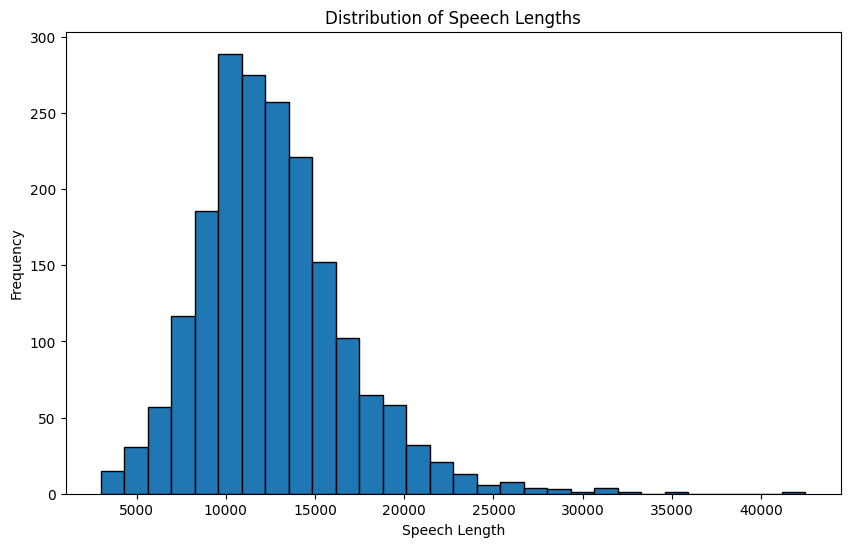

Number of speeches with length less than 100: 0


In [16]:
df['Speech_length'] = df['Speech'].apply(len)

# Plot the distribution of speech lengths
plt.figure(figsize=(10, 6))
plt.hist(df['Speech_length'], bins=30, edgecolor='black')
plt.title('Distribution of Speech Lengths')
plt.xlabel('Speech Length')
plt.ylabel('Frequency')
plt.show()

# Count the number of speeches with length less than 100
short_speeches_count = df[df['Speech_length'] < 100].shape[0]

print(f"Number of speeches with length less than 100: {short_speeches_count}")

In [17]:
nltk.download('vader_lexicon')
nltk.download('stopwords')

# Define a set of common UN-related words to ignore
common_un_words = set([
    'nations', 'united', 'international', 'development', 'world', 
    'security', 'global', 'africa', 'peace', 'people', 'humanity', 
    'cooperation', 'dialogue', 'assembly', 'agenda', 'rights',
    'countries', 'country', 'globalization', 
    'governments', 'leaders', 'economy', 'justice', 'goals'
])

# Merge common UN words with English stopwords
stop_words = set(stopwords.words('english')).union(common_un_words)

# Function to clean speech text and remove common UN-related words
def clean_speech(text):
    # Initial cleaning
    text = re.sub(r'\[.*?\]', '', text)  # Remove text in square brackets
    text = re.sub(r'http\S+', '', text)  # Remove URLs
    text = re.sub(r'\w*\d\w*', '', text)  # Remove words containing numbers
    text = re.sub(r'[^a-zA-Z\s]', '', text)  # Remove non-alphabetical characters
    text = text.lower()  # Convert to lowercase

    # Tokenize and remove stop words
    words = text.split()
    cleaned_words = [word for word in words if word not in stop_words]
    
    # Join words back into cleaned speech
    return ' '.join(cleaned_words)

# Apply cleaning function to the dataset
df['Speech_cleaned'] = df['Speech'].apply(clean_speech)

[nltk_data] Downloading package vader_lexicon to
[nltk_data]     /Users/abhinavagnihotry/nltk_data...
[nltk_data]   Package vader_lexicon is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     /Users/abhinavagnihotry/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [18]:
df.head(3)

,Life Ladder,year,Log GDP per capita,Social support,Healthy life expectancy at birth,Freedom to make life choices,Generosity,Perceptions of corruption,Positive affect,Negative affect,Country code,Speech,Country,Overall Scores,Safety and Security,Ongoing Conflict,Militarian,Speech_length,Speech_cleaned
0,3.723590,2008,7.350416,0.450662,50.500000,0.718114,0.164055,0.881686,0.414297,0.258195,AFG,Since the last time we \ngathered here in this...,Afghanistan,1.896,3.372,3.153,2.594,8883,since last time gathered great hall passed yea...
1,4.401778,2009,7.508646,0.552308,50.799999,0.678896,0.187297,0.850035,0.481421,0.237092,AFG,"First, I would like to \ncongratulate His Exce...",Afghanistan,1.765,3.603,3.246,2.609,8183,first would like congratulate excellency mr tr...
2,4.758381,2010,7.613900,0.539075,51.099998,0.600127,0.117861,0.706766,0.516907,0.275324,AFG,I join previous \nspeakers in congratulating y...,Afghanistan,1.838,3.549,3.087,2.629,11062,join previous speakers congratulating sir elec...


In [19]:
# df_cleaned.to_pickle("cleaned_df")

## 3. Exploratory Data Analysis

In [20]:
# Imports
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import re
import nltk
from nltk.corpus import stopwords
from nltk.sentiment import SentimentIntensityAnalyzer
from sklearn.feature_extraction.text import CountVectorizer
from collections import Counter
from wordcloud import WordCloud

In [21]:
# df = pd.read_pickle("./df_complete")

#### Wordcloud to check the frequently mentioned terms

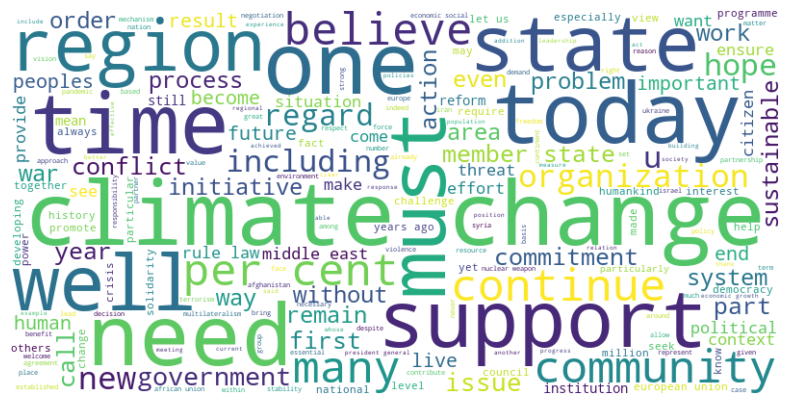

In [22]:
all_speeches = ' '.join(df['Speech_cleaned'])
wordcloud = WordCloud(width=800, height=400, background_color='white', colormap='viridis').generate(all_speeches)

plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.show()


In [23]:
sorted(df["Country"].unique())[:10]

['Afghanistan',
 'Albania',
 'Algeria',
 'Angola',
 'Argentina',
 'Armenia',
 'Australia',
 'Austria',
 'Azerbaijan',
 'Bahrain']

#### Sentiment Analysis 

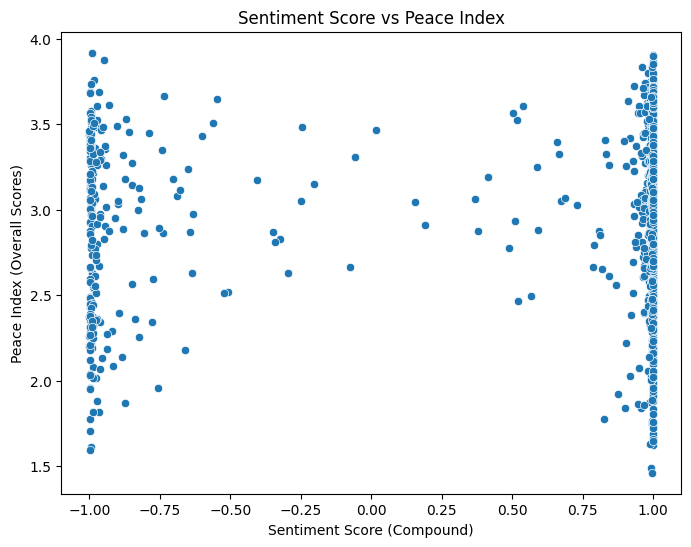

In [24]:
# Set up sentiment analysis
sia = SentimentIntensityAnalyzer()

# Apply sentiment analysis on cleaned speeches
df['sentiment_score'] = df['Speech_cleaned'].apply(lambda x: sia.polarity_scores(x)['compound'])

# EDA 1: Correlation between sentiment score and peace index
plt.figure(figsize=(8, 6))
sns.scatterplot(data=df, x='sentiment_score', y='Overall Scores')
plt.title('Sentiment Score vs Peace Index')
plt.xlabel('Sentiment Score (Compound)')
plt.ylabel('Peace Index (Overall Scores)')
plt.show()

#### Changes in speech tone over time relative to peace index

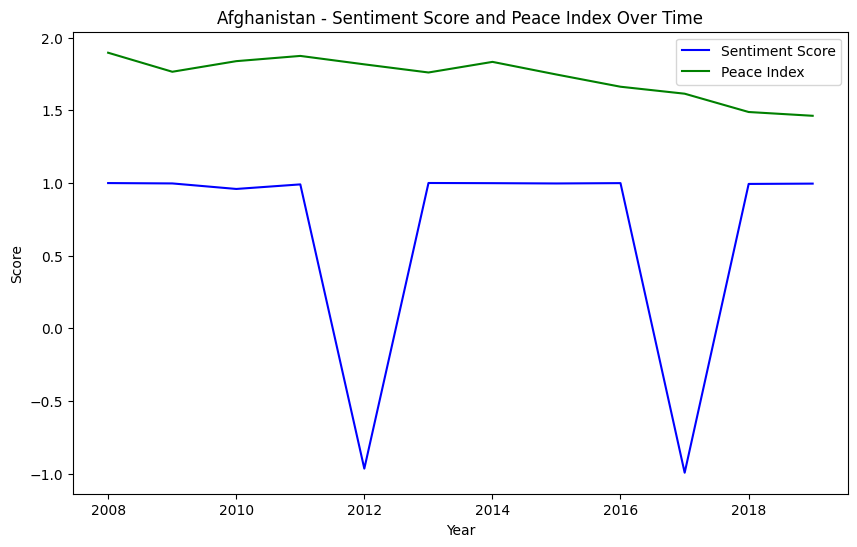

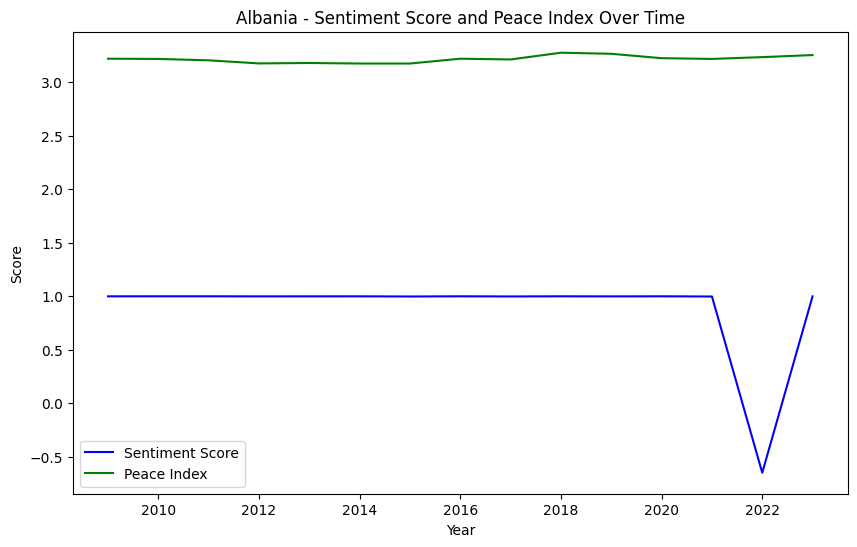

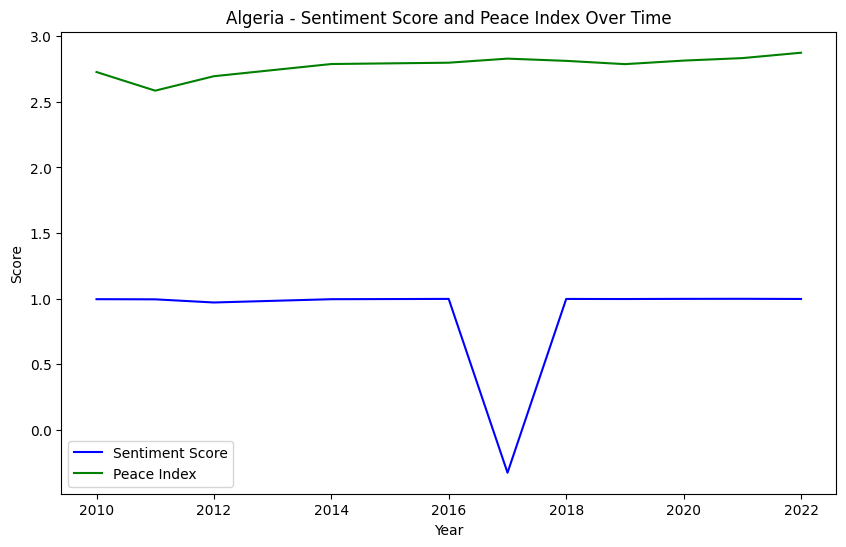

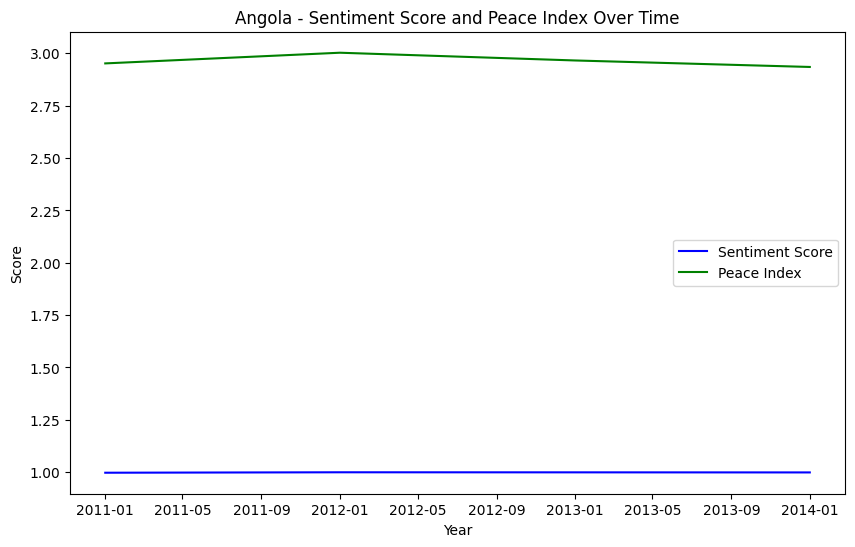

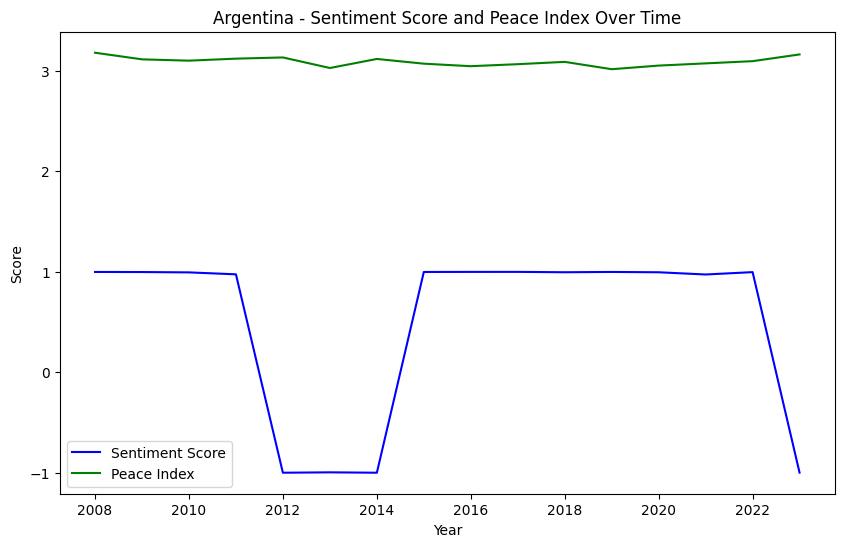

...

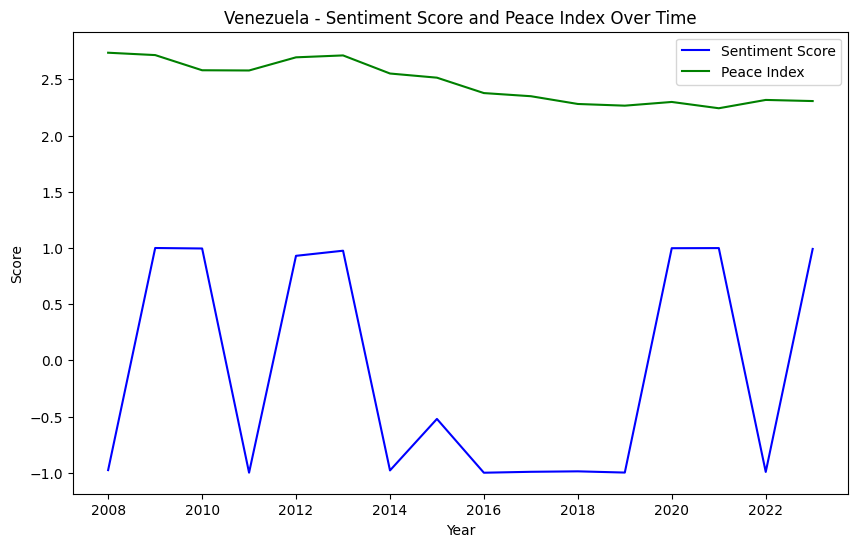

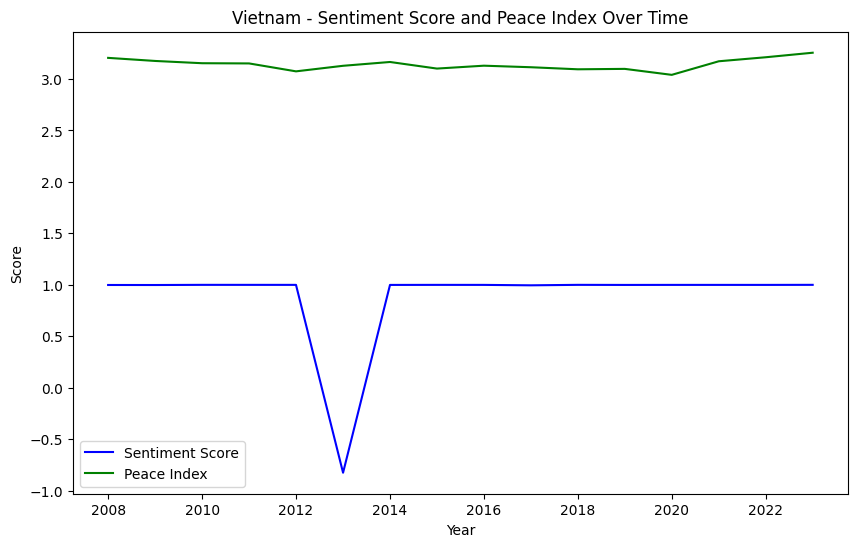

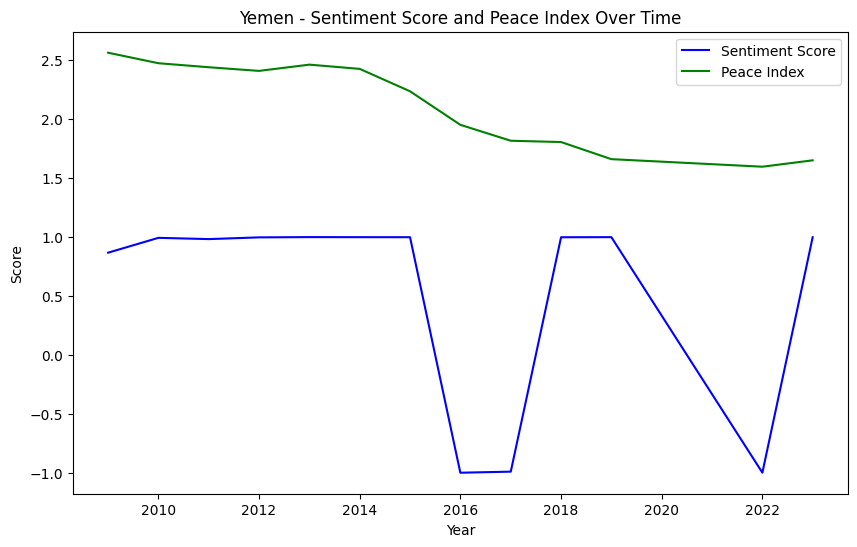

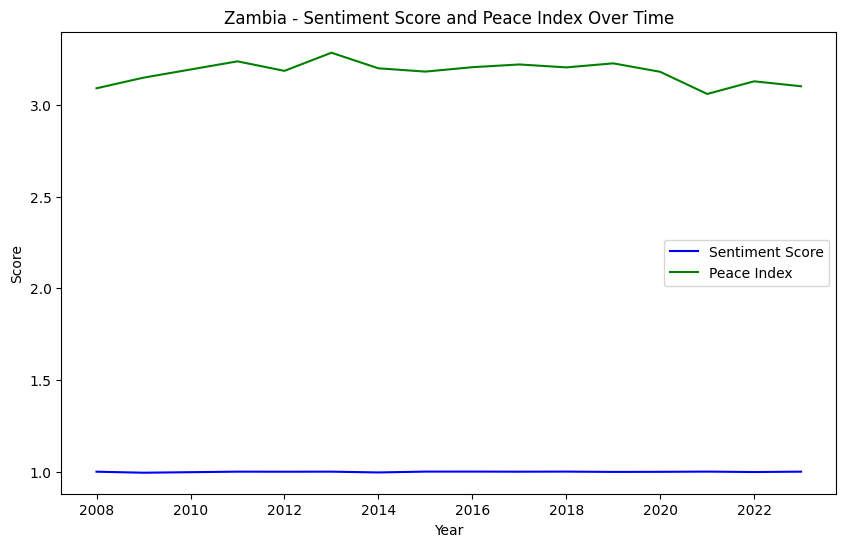

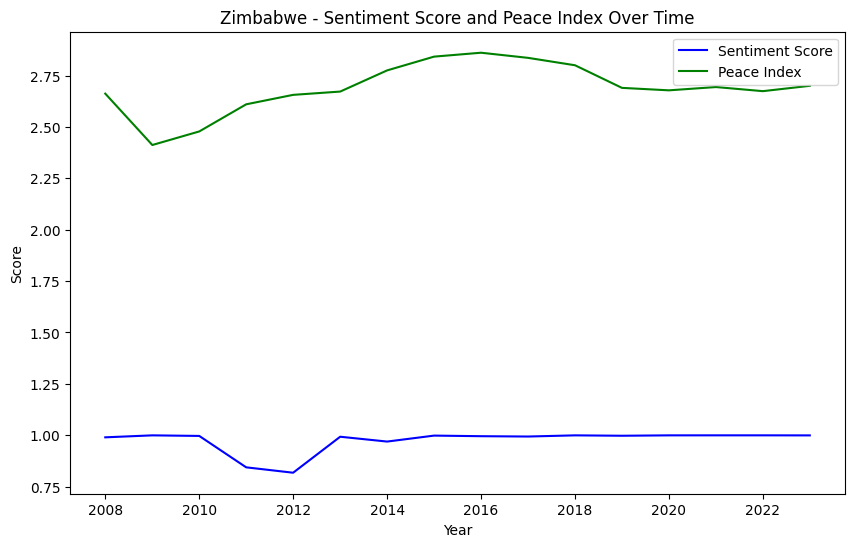

In [25]:
df['year'] = pd.to_datetime(df['year'], format='%Y')
df.sort_values(by=['Country', 'year'], inplace=True)

# Group by country to observe changes in sentiment over time
country_groups = df.groupby('Country')

for name, group in country_groups:  # remove [:3] to plot for all countries
    plt.figure(figsize=(10, 6))
    plt.plot(group['year'], group['sentiment_score'], label='Sentiment Score', color='blue')
    plt.plot(group['year'], group['Overall Scores'], label='Peace Index', color='green')
    plt.title(f'{name} - Sentiment Score and Peace Index Over Time')
    plt.xlabel('Year')
    plt.ylabel('Score')
    plt.legend()
    plt.show()

#### Mentions of peace/conflict-related terms vs. Peace Index

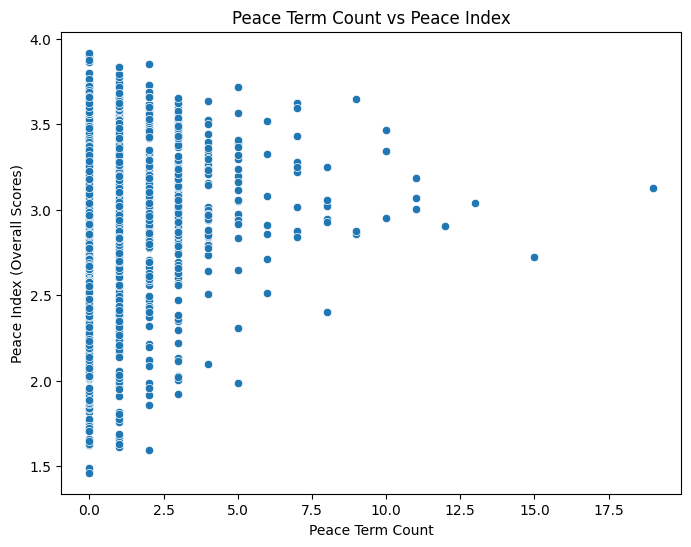

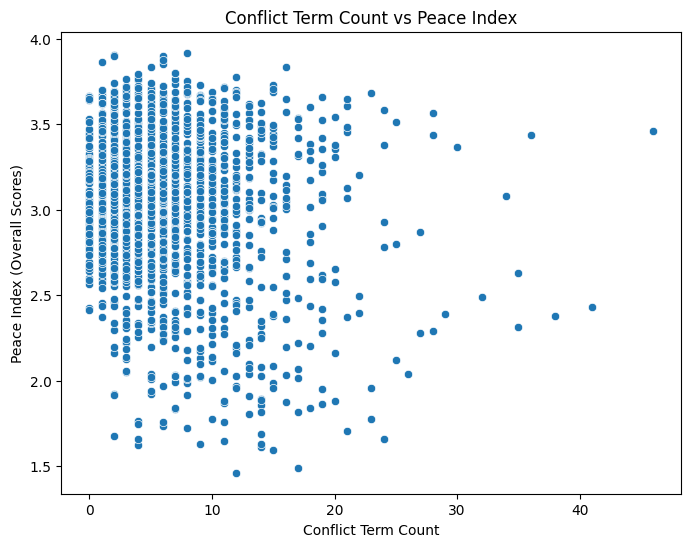

In [26]:
# Define lists of peace- and conflict-related terms
peace_terms = ['peace', 'harmony', 'cooperation', 'dialogue', 'negotiation', 'mediation', 'diplomacy']
conflict_terms = ['war', 'conflict', 'violence', 'aggression', 'hostility', 'terrorism', 'casualities']

# Function to count term frequency in speech
def count_terms(speech, term_list):
    speech_words = speech.split()
    term_counts = sum([1 for word in speech_words if word in term_list])
    return term_counts

df['peace_term_count'] = df['Speech_cleaned'].apply(lambda x: count_terms(x, peace_terms))
df['conflict_term_count'] = df['Speech_cleaned'].apply(lambda x: count_terms(x, conflict_terms))

# Plot peace term count vs. peace index
plt.figure(figsize=(8, 6))
sns.scatterplot(data=df, x='peace_term_count', y='Overall Scores')
plt.title('Peace Term Count vs Peace Index')
plt.xlabel('Peace Term Count')
plt.ylabel('Peace Index (Overall Scores)')
plt.show()

# Plot conflict term count vs. peace index
plt.figure(figsize=(8, 6))
sns.scatterplot(data=df, x='conflict_term_count', y='Overall Scores')
plt.title('Conflict Term Count vs Peace Index')
plt.xlabel('Conflict Term Count')
plt.ylabel('Peace Index (Overall Scores)')
plt.show()

#### Geopolitical regions, peace index, and speech content


Top 10 words for Africa:
african: 2279
support: 2005
efforts: 1961
economic: 1688
sustainable: 1687
community: 1609
states: 1600
general: 1555
climate: 1478
national: 1469

Top 10 words for Asia:
human: 1306
economic: 1249
sustainable: 1230
efforts: 1217
community: 1206
climate: 1131
new: 1129
change: 1067
states: 1060
support: 1023

Top 10 words for Europe:
human: 3064
states: 2557
new: 2285
council: 2202
support: 2039
need: 1974
sustainable: 1918
efforts: 1911
climate: 1847
years: 1841

Top 10 words for Middle East:
region: 788
efforts: 758
arab: 752
israel: 723
state: 721
states: 703
iran: 647
support: 635
political: 593
iraq: 544

Top 10 words for North America:
canada: 312
mexico: 281
human: 195
change: 139
support: 126
work: 123
states: 122
today: 121
council: 114
climate: 113

Top 10 words for Oceania:
new: 369
australia: 300
zealand: 209
council: 198
pacific: 183
states: 158
climate: 147
change: 146
work: 145
region: 135

Top 10 words for Other:
human: 725
states: 621
economic

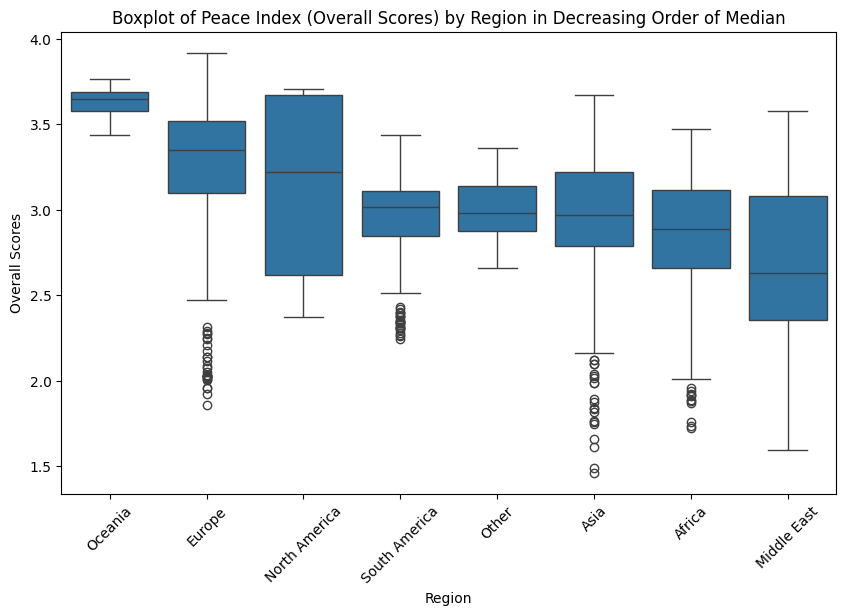

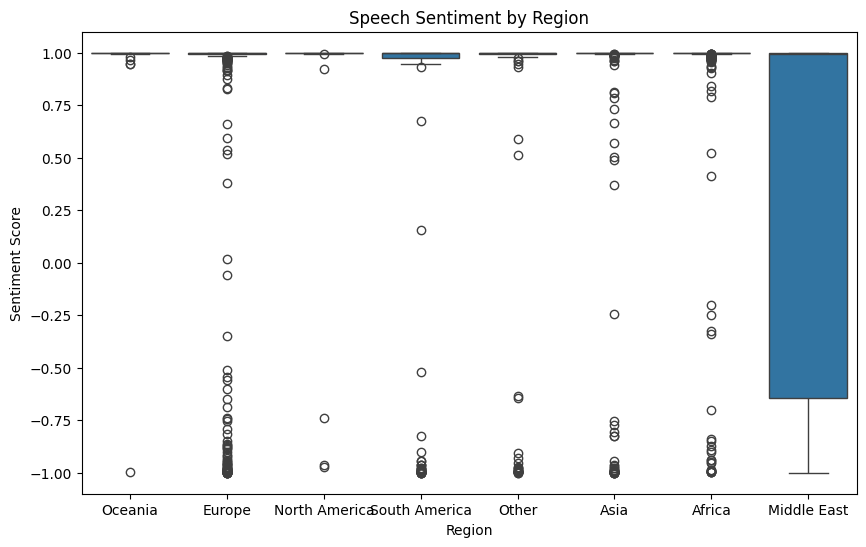

In [27]:
from regions import regions

# Add region information to dataframe
def get_region(country_name):
    for region, countries in regions.items():
        if country_name in countries:
            return region
    return 'Other'

df['Region'] = df['Country'].apply(get_region)

# Group by region and analyze speech content
region_groups = df.groupby('Region')

# Function to print the top N words for each region
def print_top_words(region, text_data, n=10):
    vectorizer = CountVectorizer(stop_words='english', max_features=n)
    X = vectorizer.fit_transform(text_data)
    word_counts = X.toarray().sum(axis=0)
    words = vectorizer.get_feature_names_out()
    word_freq = dict(zip(words, word_counts))
    
    # Sort words by frequency and print the top N
    sorted_words = sorted(word_freq.items(), key=lambda x: x[1], reverse=True)
    print(f"\nTop {n} words for {region}:")
    for word, count in sorted_words:
        print(f"{word}: {count}")

# Loop over each region and print the top words
for region, group in region_groups:
    text_data = group['Speech_cleaned'].values
    print_top_words(region, text_data)

# Calculate median peace index for each region
median_peace_by_region = df.groupby('Region')['Overall Scores'].median().sort_values(ascending=False)

# Reorder the DataFrame based on the sorted region order
df['Region'] = pd.Categorical(df['Region'], categories=median_peace_by_region.index, ordered=True)

# Plot boxplots in the decreasing order of median peace index
plt.figure(figsize=(10, 6))
sns.boxplot(x='Region', y='Overall Scores', data=df, order=median_peace_by_region.index)
plt.title('Boxplot of Peace Index (Overall Scores) by Region in Decreasing Order of Median')
plt.xticks(rotation=45)
plt.show()

# Explore regional differences in speech tone (sentiment)
plt.figure(figsize=(10, 6))
sns.boxplot(x='Region', y='sentiment_score', data=df)
plt.title('Speech Sentiment by Region')
plt.xlabel('Region')
plt.ylabel('Sentiment Score')
plt.show()

#### Filter the dataframe for Ukraine

/var/folders/qw/kndrzd253bbb5qrt4cz3wxqr0000gn/T/ipykernel_21089/4194086427.py:8: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  ukraine_df['sentiment_score_rolling'].fillna(method='ffill', inplace=True)


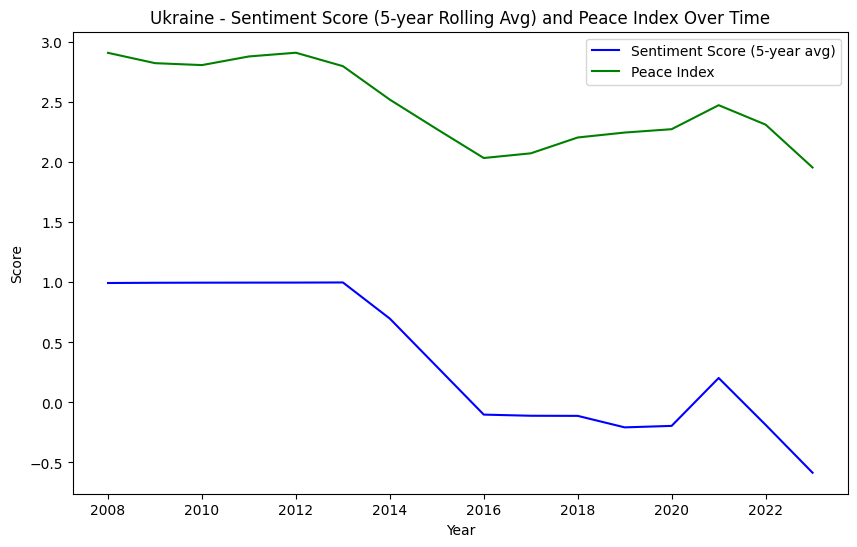

In [28]:
ukraine_df = df[df['Country'] == 'Ukraine']

# Apply a rolling 5-year average for sentiment score to better smooth fluctuations
ukraine_df = ukraine_df.set_index('year').sort_index()
ukraine_df['sentiment_score_rolling'] = ukraine_df['sentiment_score'].rolling(window=5, min_periods=1).mean()

# Fill any missing values after the rolling calculation (if necessary)
ukraine_df['sentiment_score_rolling'].fillna(method='ffill', inplace=True)

# Plot the sentiment score (5-year rolling avg) and the peace index
plt.figure(figsize=(10, 6))
plt.plot(ukraine_df.index, ukraine_df['sentiment_score_rolling'], label='Sentiment Score (5-year avg)', color='blue')
plt.plot(ukraine_df.index, ukraine_df['Overall Scores'], label='Peace Index', color='green')
plt.title('Ukraine - Sentiment Score (5-year Rolling Avg) and Peace Index Over Time')
plt.xlabel('Year')
plt.ylabel('Score')
plt.legend()
plt.show()


#### Implement the rolling average  for sentiment scores

In [29]:
# Ensure 'year' is in the correct datetime format
df['year'] = pd.to_datetime(df['year'], format='%Y', errors='coerce')

# Extract only the year component (this will turn the year into integers)
df['year'] = df['year'].dt.year

# Sort the DataFrame by 'Country name' and 'year'
df.sort_values(by=['Country', 'year'], inplace=True)

# Group by 'Country name' and calculate the rolling average for each country without setting 'year' as the index
df['sentiment_score_rolling'] = df.groupby('Country')['sentiment_score'].transform(lambda x: x.rolling(window=5, min_periods=1).mean())

# Handle missing data by forward filling any NaNs
df['sentiment_score_rolling'].fillna(method='ffill', inplace=True)

/var/folders/qw/kndrzd253bbb5qrt4cz3wxqr0000gn/T/ipykernel_21089/412267343.py:14: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df['sentiment_score_rolling'].fillna(method='ffill', inplace=True)


In [30]:
df.head(2)

,Life Ladder,year,Log GDP per capita,Social support,Healthy life expectancy at birth,Freedom to make life choices,Generosity,Perceptions of corruption,Positive affect,Negative affect,...,Safety and Security,Ongoing Conflict,Militarian,Speech_length,Speech_cleaned,sentiment_score,peace_term_count,conflict_term_count,Region,sentiment_score_rolling
0,3.723590,2008,7.350416,0.450662,50.500000,0.718114,0.164055,0.881686,0.414297,0.258195,...,3.372,3.153,2.594,8883,since last time gathered great hall passed yea...,0.9990,0,14,Asia,0.99900
1,4.401778,2009,7.508646,0.552308,50.799999,0.678896,0.187297,0.850035,0.481421,0.237092,...,3.603,3.246,2.609,8183,first would like congratulate excellency mr tr...,0.9965,0,4,Asia,0.99775


#### Find the correlation between Peace Index (Overall Score) and other numerical values

In [31]:
# Ensure we are working with only numerical columns
numerical_df = df.select_dtypes(include='number')

# Calculate the correlation between all numerical columns and the 'Overall Scores' column (Peace Index)
correlations = numerical_df.corr()['Overall Scores'].sort_values(ascending=False)

# Print the correlation results
print("correlations with peace index")
print(correlations)


correlations with peace index
Overall Scores                      1.000000
Log GDP per capita                  0.522039
Life Ladder                         0.492368
Healthy life expectancy at birth    0.475893
Social support                      0.445146
Freedom to make life choices        0.403474
Positive affect                     0.305994
sentiment_score_rolling             0.267053
sentiment_score                     0.138919
Generosity                          0.110654
peace_term_count                    0.013014
year                                0.003144
conflict_term_count                -0.139605
Speech_length                      -0.140778
Perceptions of corruption          -0.332434
Negative affect                    -0.339416
Militarian                         -0.567147
Ongoing Conflict                   -0.895527
Safety and Security                -0.907123
Name: Overall Scores, dtype: float64


In [32]:
# Create a dictionary to store the correlation values for each country
correlations_by_country = {}

# Group by 'Country name' and calculate the correlation for each group
for country, group in df.groupby('Country'):
    # Drop rows with missing values in either 'sentiment_score_rolling' or 'Overall Scores'
    group = group[['sentiment_score_rolling', 'Overall Scores']].dropna()
    
    # Check if there is enough data to calculate correlation
    if len(group) > 1:  # Correlation requires at least 2 data points
        correlation = group['sentiment_score_rolling'].corr(group['Overall Scores'])
        correlations_by_country[country] = correlation

# Convert the dictionary to a pandas DataFrame for easy sorting and manipulation
correlation_df = pd.DataFrame(list(correlations_by_country.items()), columns=['Country', 'Correlation'])

# Sort the DataFrame by correlation values in descending order
correlation_df.sort_values(by='Correlation', ascending=False, inplace=True)

# Display the top 10 countries with the highest correlations
print(correlation_df.head(10))


         Country  Correlation
34      Djibouti     1.000000
133      Ukraine     0.951415
140        Yemen     0.942159
107       Rwanda     0.843576
45       Georgia     0.806536
105      Romania     0.768459
122       Sweden     0.768046
120    Sri Lanka     0.760955
118  South Sudan     0.749581
65    Kazakhstan     0.739721


In [33]:
# Filter the DataFrame for countries with a negative correlation
negative_correlation_df = correlation_df[correlation_df['Correlation'] < 0]

# Filter the DataFrame for countries with a positive correlation
positive_correlation_df = correlation_df[correlation_df['Correlation'] > 0]

# Print the number of countries with a negative correlation
print(f"Number of countries with a negative correlation: {len(negative_correlation_df)}")

# Print the number of countries with a positive correlation
print(f"Number of countries with a positive correlation: {len(positive_correlation_df)}")


Number of countries with a negative correlation: 67
Number of countries with a positive correlation: 76


In [34]:
numerical_df = df.select_dtypes(include='number')

# Calculate the correlation between all numerical columns and the 'Overall Scores' column (Peace Index)
correlations = numerical_df.corr()['Overall Scores'].sort_values(ascending=False)

# Print the correlation results
print("correlations with peace index")
print(correlations)

correlations with peace index
Overall Scores                      1.000000
Log GDP per capita                  0.522039
Life Ladder                         0.492368
Healthy life expectancy at birth    0.475893
Social support                      0.445146
Freedom to make life choices        0.403474
Positive affect                     0.305994
sentiment_score_rolling             0.267053
sentiment_score                     0.138919
Generosity                          0.110654
peace_term_count                    0.013014
year                                0.003144
conflict_term_count                -0.139605
Speech_length                      -0.140778
Perceptions of corruption          -0.332434
Negative affect                    -0.339416
Militarian                         -0.567147
Ongoing Conflict                   -0.895527
Safety and Security                -0.907123
Name: Overall Scores, dtype: float64


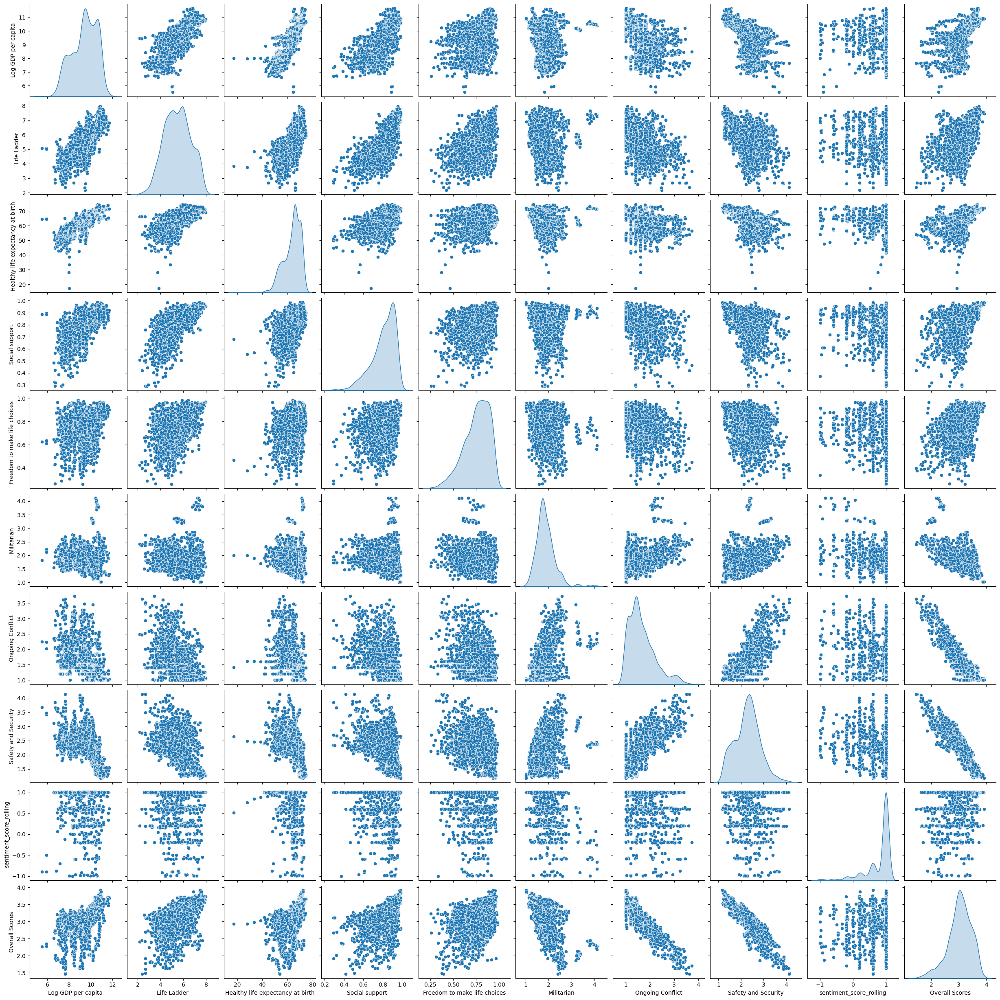

In [35]:
selected_features = ['Log GDP per capita', 'Life Ladder', 'Healthy life expectancy at birth', 
                     'Social support', 'Freedom to make life choices', 'Militarian', 
                     'Ongoing Conflict', 'Safety and Security', 'sentiment_score_rolling', 'Overall Scores']

# Filter the dataframe to include only the selected features
df_selected = df[selected_features].dropna()

# Create a seaborn pairplot to visualize the relationships between variables
sns.pairplot(df_selected, diag_kind='kde')

# Display the plot
plt.show()


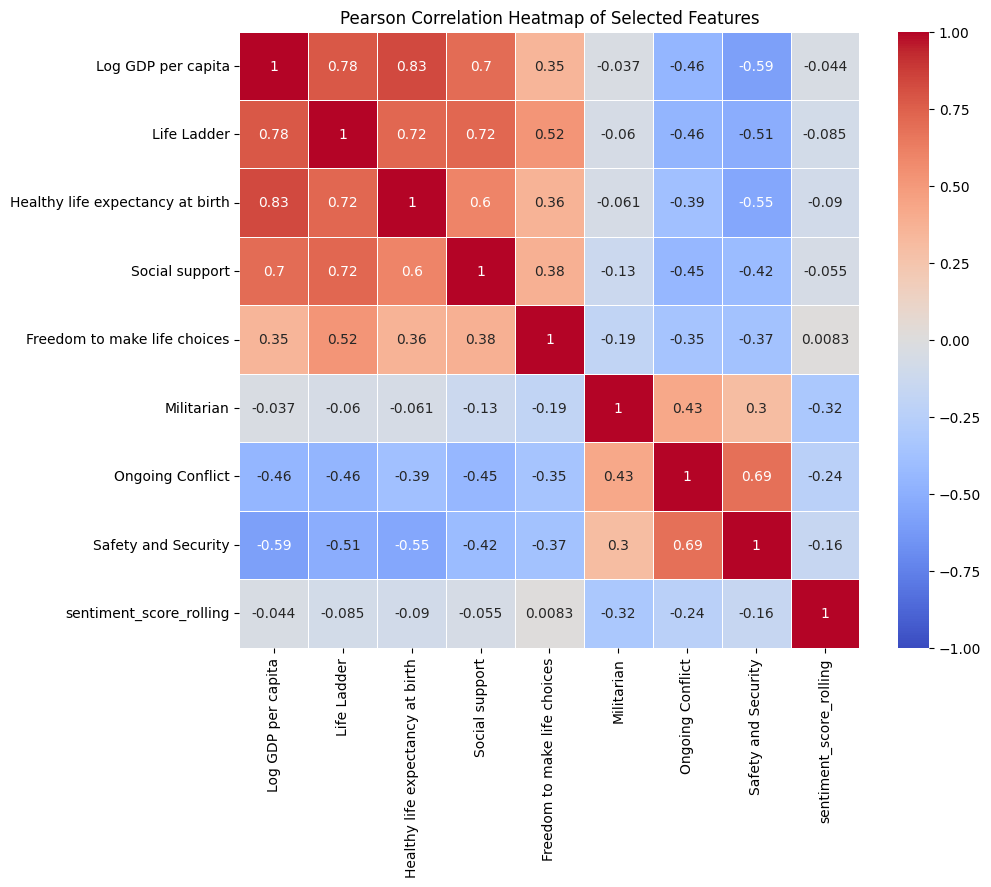

In [36]:
selected_features = ['Log GDP per capita', 'Life Ladder', 'Healthy life expectancy at birth', 
                     'Social support', 'Freedom to make life choices', 'Militarian', 
                     'Ongoing Conflict', 'Safety and Security', 'sentiment_score_rolling']

# Filter the dataframe to include only the selected features
df_selected = df[selected_features].dropna()

# Calculate the Pearson correlation matrix
correlation_matrix = df_selected.corr()

# Plot the heatmap for the correlation matrix
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', center=0, linewidths=0.5, vmin=-1, vmax=1)
plt.title('Pearson Correlation Heatmap of Selected Features')
plt.show()


In [37]:
# df.to_pickle('updated_dataframe_full.pkl')

## 4. Prediction

In [38]:
from sklearn.model_selection import cross_val_score, KFold
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
import itertools
import matplotlib.pyplot as plt
import seaborn as sns
import statsmodels

In [39]:
# df = pd.read_pickle('updated_dataframe.pkl')
# df.head(2)

#### Base Linear Regression model with all features

In [40]:
selected_features = ['Log GDP per capita', 'Life Ladder', 'Social support', 
                     'Freedom to make life choices', 'Militarian', 
                     'sentiment_score_rolling']


X = df[selected_features].dropna()
y = df.loc[X.index, 'Overall Scores']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

model = LinearRegression()

cv = KFold(n_splits=5, shuffle=True, random_state=42)
cv_r2_scores = cross_val_score(model, X_train, y_train, cv=cv, scoring='r2')
mean_r2_score = np.mean(cv_r2_scores)

model.fit(X_train, y_train)

y_pred = model.predict(X_test)

mse = mean_squared_error(y_test, y_pred)
r2_test = model.score(X_test, y_test)

print(f"Mean R² score (cross-validated on training set): {mean_r2_score:.3f}")
print(f"R² score on test set: {r2_test:.3f}")
print(f"Mean Squared Error (MSE) on test set: {mse:.3f}")


Mean R² score (cross-validated on training set): 0.619
R² score on test set: 0.545
Mean Squared Error (MSE) on test set: 0.068


#### Finding the best set of features

In [41]:
# Define your list of possible features (excluding 'sentiment_score_rolling' to add it explicitly in combinations)
features = ['Log GDP per capita', 'Life Ladder', 'Healthy life expectancy at birth', 
                     'Social support', 'Freedom to make life choices', 'Militarian', 
                     'sentiment_score_rolling']

# Always include 'sentiment_score_rolling'
base_feature = ['sentiment_score_rolling']

# Function to calculate adjusted R²
def adjusted_r2(r2, n, p):
    return 1 - (1 - r2) * (n - 1) / (n - p - 1)

# Function to get the adjusted R² score for a set of features
def get_adjusted_r2_score(X, y, selected_features):
    X_selected = X[selected_features].dropna()
    y_selected = y.loc[X_selected.index]

    X_train, X_test, y_train, y_test = train_test_split(X_selected, y_selected, test_size=0.2, random_state=42)
    
    model = LinearRegression()
    model.fit(X_train, y_train)

    # R² score
    r2_test = model.score(X_test, y_test)

    # Calculate adjusted R²
    n = len(y_test)
    p = len(selected_features)
    adj_r2_test = adjusted_r2(r2_test, n, p)
    
    return adj_r2_test, r2_test

# Iterate over all possible combinations of features
results = []
for i in range(1, len(features) + 1):
    for combination in itertools.combinations(features, i):
        selected_features = base_feature + list(combination)
        adj_r2, r2 = get_adjusted_r2_score(df, df['Overall Scores'], selected_features)
        results.append({
            'features': selected_features,
            'R²': r2,
            'Adjusted R²': adj_r2
        })

# Sort results by Adjusted R²
results_sorted = sorted(results, key=lambda x: x['Adjusted R²'], reverse=True)

# Print the top 5 combinations
for result in results_sorted[:5]:
    print(f"Features: {result['features']}, R²: {result['R²']:.3f}, Adjusted R²: {result['Adjusted R²']:.3f}")


Features: ['sentiment_score_rolling', 'Log GDP per capita', 'Life Ladder', 'Healthy life expectancy at birth', 'Militarian'], R²: 0.643, Adjusted R²: 0.638
Features: ['sentiment_score_rolling', 'Log GDP per capita', 'Life Ladder', 'Healthy life expectancy at birth', 'Militarian', 'sentiment_score_rolling'], R²: 0.643, Adjusted R²: 0.637
Features: ['sentiment_score_rolling', 'Log GDP per capita', 'Life Ladder', 'Militarian'], R²: 0.640, Adjusted R²: 0.636
Features: ['sentiment_score_rolling', 'Log GDP per capita', 'Life Ladder', 'Militarian', 'sentiment_score_rolling'], R²: 0.640, Adjusted R²: 0.635
Features: ['sentiment_score_rolling', 'Log GDP per capita', 'Healthy life expectancy at birth', 'Militarian'], R²: 0.632, Adjusted R²: 0.628


#### Model performance with the selected features

In [42]:
# Define the selected features
selected_features = ['sentiment_score_rolling', 'Life Ladder', 'Ongoing Conflict']

# Prepare the data
X = df[selected_features].dropna()
y = df.loc[X.index, 'Overall Scores']

# Train-test split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Define the linear regression model
model = LinearRegression()

# Perform 5-fold cross-validation
cv = KFold(n_splits=5, shuffle=True, random_state=42)
cv_r2_scores = cross_val_score(model, X_train, y_train, cv=cv, scoring='r2')
mean_r2_score = np.mean(cv_r2_scores)

# Train the model on the training data
model.fit(X_train, y_train)

# Predict on the test set
y_pred = model.predict(X_test)

# Evaluate the model
mse = mean_squared_error(y_test, y_pred)
r2_test = model.score(X_test, y_test)

# Output the results
print(f"Mean R² score (cross-validated on training set): {mean_r2_score:.3f}")
print(f"R² score on test set: {r2_test:.3f}")
print(f"Mean Squared Error (MSE) on test set: {mse:.3f}")


Mean R² score (cross-validated on training set): 0.814
R² score on test set: 0.806
Mean Squared Error (MSE) on test set: 0.034


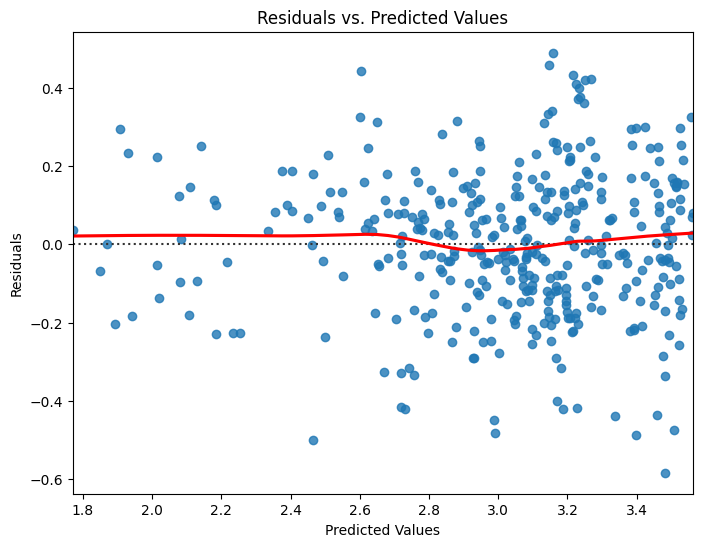

In [43]:
y_pred = model.predict(X_test)
residuals = y_test - y_pred

plt.figure(figsize=(8, 6))
sns.residplot(x=y_pred, y=residuals, lowess=True, line_kws={'color': 'red'})
plt.title('Residuals vs. Predicted Values')
plt.xlabel('Predicted Values')
plt.ylabel('Residuals')
plt.show()

#### Model performance comparison with Ridge and Lasso

In [44]:
from sklearn.linear_model import Ridge, Lasso
from sklearn.model_selection import GridSearchCV

# Define the features and target variable
X = df[['sentiment_score_rolling', 'Life Ladder', 'Ongoing Conflict']].dropna()
y = df.loc[X.index, 'Overall Scores']

# Train-test split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Ridge regression with hyperparameter tuning
ridge = Ridge()
ridge_params = {'alpha': [0.01, 0.1, 1, 10, 100]}
ridge_cv = GridSearchCV(ridge, ridge_params, cv=5, scoring='r2')
ridge_cv.fit(X_train, y_train)

# Lasso regression with hyperparameter tuning
lasso = Lasso()
lasso_params = {'alpha': [0.01, 0.1, 1, 10, 100]}
lasso_cv = GridSearchCV(lasso, lasso_params, cv=5, scoring='r2')
lasso_cv.fit(X_train, y_train)

# Evaluate Ridge and Lasso on test set
ridge_best = ridge_cv.best_estimator_
lasso_best = lasso_cv.best_estimator_

y_pred_ridge = ridge_cv.predict(X_test)
y_pred_lasso = lasso_cv.predict(X_test)

ridge_test_r2 = ridge_best.score(X_test, y_test)
mse_ridge_test = mean_squared_error(y_test, y_pred_ridge)
lasso_test_r2 = lasso_best.score(X_test, y_test)
mse_lasso_test = mean_squared_error(y_test, y_pred_lasso)

print(f"Best Ridge alpha: {ridge_cv.best_params_['alpha']}")
print(f"Ridge R² on test set: {ridge_test_r2:.3f}")
print(f"Ridge MSE on test set: {mse_ridge_test:.3f}")
print("\n\n")
print(f"Best Lasso alpha: {lasso_cv.best_params_['alpha']}")
print(f"Lasso R² on test set: {lasso_test_r2:.3f}")
print(f"Lasso MSE on test set: {mse_lasso_test:.3f}")


Best Ridge alpha: 1
Ridge R² on test set: 0.806
Ridge MSE on test set: 0.034



Best Lasso alpha: 0.01
Lasso R² on test set: 0.798
Lasso MSE on test set: 0.035


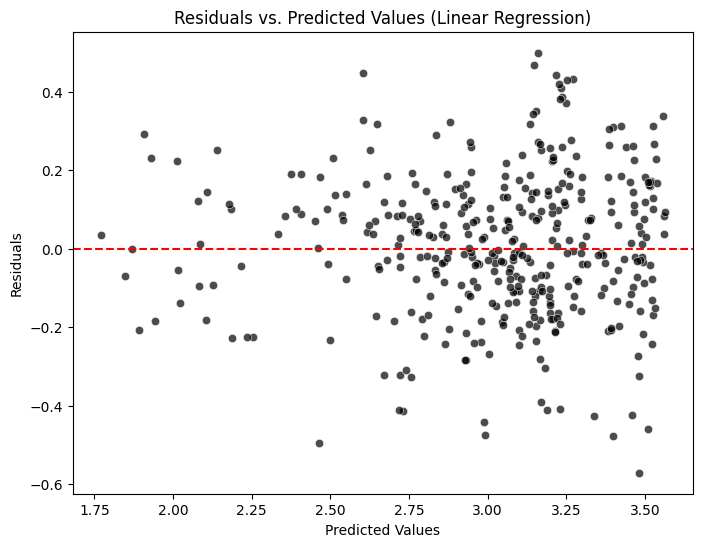

In [45]:
y_pred = model.predict(X_test)
residuals = y_test - y_pred

plt.figure(figsize=(8, 6))
sns.scatterplot(x=y_pred, y=residuals, color='black', alpha=0.7)
plt.axhline(y=0, color='r', linestyle='--')
# sns.residplot(x=y_pred, y=residuals, lowess=True, line_kws={'color': 'red'})
plt.title('Residuals vs. Predicted Values (Linear Regression)')
plt.xlabel('Predicted Values')
plt.savefig("linear_reg_residuals_new.png")
plt.ylabel('Residuals')
plt.show()

#### Random Forest model for the selected features

In [46]:
from sklearn.ensemble import RandomForestRegressor

# Define the model
forest_model = RandomForestRegressor(n_estimators=100, random_state=42)

# Train the model
forest_model.fit(X_train, y_train)

# Predict on the test set
y_pred_forest = forest_model.predict(X_test)

# Evaluate the model
r2_forest = forest_model.score(X_test, y_test)
mse_forest = mean_squared_error(y_test, y_pred_forest)

print(f"Random Forest R² on test set: {r2_forest:.3f}")
print(f"Random Forest MSE on test set: {mse_forest:.3f}")


Random Forest R² on test set: 0.847
Random Forest MSE on test set: 0.027


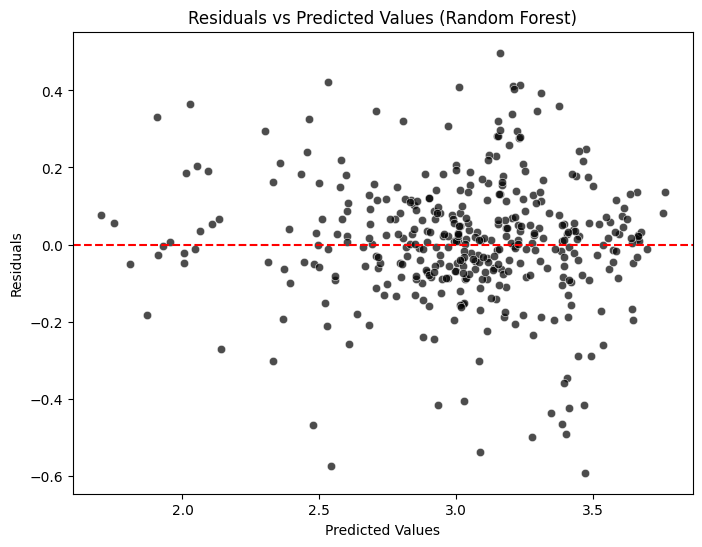

In [47]:
# Predict on the test set
y_pred_forest = forest_model.predict(X_test)

# Calculate residuals
residuals_forest = y_test - y_pred_forest

# Create the residual plot
plt.figure(figsize=(8, 6))
sns.scatterplot(x=y_pred_forest, y=residuals_forest, color='black', alpha=0.7)
plt.axhline(y=0, color='r', linestyle='--')
plt.title('Residuals vs Predicted Values (Random Forest)')
plt.xlabel('Predicted Values')
plt.ylabel('Residuals')
# plt.grid(True) 
plt.savefig("randomforest_residuals_new.png")
plt.show()
